In [117]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [118]:
%config InlineBackend.figure_format ='retina'


In [167]:
import pandas as pd
pd.set_option('display.max_columns', None)

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme()
import ipywidgets as widgets
from ipywidgets import interact, interact_manual

from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.pipeline import make_pipeline
from sklearn.neighbors import KNeighborsClassifier

from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import AdaBoostClassifier, GradientBoostingClassifier, \
                             RandomForestClassifier, StackingClassifier
from sklearn.naive_bayes import GaussianNB
import xgboost as xgb

from sklearn.model_selection import train_test_split, cross_validate, GridSearchCV, KFold
from sklearn.metrics import accuracy_score, confusion_matrix, f1_score, precision_score, \
                            recall_score, roc_auc_score, roc_curve, classification_report

## Load data in

In [70]:
df = pd.read_csv('data/cleaned_data.csv', index_col = 0)
df2 = pd.read_csv('data/cleaned_data_more_feats.csv', index_col = 0)

In [71]:
df

,id,koi_name,kepler_name,planet_status,data_disposition,koi_score,not_transit_flag,stellar_eclipse_flag,centroid_offset_flag,emic_flag,period,transit_epoch,impact_parameter,transit_duration,transit_depth,radius,eq_temp,insol_flux,signal_to_noise,stellar_eff_temp,stellar_surf_grav,stellar_radius,ra,dec,kepler_band,disposition_num
0,10797460,K00752.01,Kepler-227 b,CONFIRMED,CANDIDATE,1.000,0,0,0,0,9.488036,170.538750,0.146,2.95750,616.0,2.26,793,93.59,35.8,5455,4.467,0.927,291.93423,48.141651,15.347,1
1,10797460,K00752.02,Kepler-227 c,CONFIRMED,CANDIDATE,0.969,0,0,0,0,54.418383,162.513840,0.586,4.50700,875.0,2.83,443,9.11,25.8,5455,4.467,0.927,291.93423,48.141651,15.347,1
2,10811496,K00753.01,NaN,CANDIDATE,CANDIDATE,0.000,0,0,0,0,19.899140,175.850252,0.969,1.78220,10800.0,14.60,638,39.30,76.3,5853,4.544,0.868,297.00482,48.134129,15.436,1
3,10848459,K00754.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,0,0,1.736952,170.307565,1.276,2.40641,8080.0,33.46,1395,891.96,505.6,5805,4.564,0.791,285.53461,48.285210,15.597,0
4,10854555,K00755.01,Kepler-664 b,CONFIRMED,CANDIDATE,1.000,0,0,0,0,2.525592,171.595550,0.701,1.65450,603.0,2.75,1406,926.16,40.9,6031,4.438,1.046,288.75488,48.226200,15.509,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9194,10090151,K07985.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.000,0,1,1,0,0.527699,131.705093,1.252,3.22210,1580.0,29.35,2088,4500.53,453.3,5638,4.529,0.903,297.18875,47.093819,14.082,0
9195,10128825,K07986.01,NaN,CANDIDATE,CANDIDATE,0.497,0,0,0,0,1.739849,133.001270,0.043,3.11400,48.5,0.72,1608,1585.81,10.6,6119,4.444,1.031,286.50937,47.163219,14.757,1
9196,10147276,K07987.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.021,0,0,1,0,0.681402,132.181750,0.147,0.86500,104.0,1.07,2218,5713.41,12.3,6173,4.447,1.041,294.16489,47.176281,15.385,0
9197,10155286,K07988.01,NaN,CANDIDATE,CANDIDATE,0.092,0,0,0,0,333.486169,153.615010,0.214,3.19900,639.0,19.30,557,22.68,14.0,4989,2.992,7.824,296.76288,47.145142,10.998,1


In [72]:
df2

,id,koi_name,kepler_name,planet_status,data_disposition,period,impact_parameter,transit_duration,transit_depth,radius,sma,inclination,eq_temp,mse_stat,mme_stat,signal_to_noise,num_transits,oedc_stat,stellar_eff_temp,stellar_surf_grav,stellar_metal,stellar_radius,stellar_mass,ra,dec,disposition_num
rowid,,,,,,,,,,,,,,,,,,,,,,,,,,
1,10797460,K00752.01,Kepler-227 b,CONFIRMED,CANDIDATE,9.488036,0.146,2.95750,616.0,2.26,0.0853,89.66,793.0,5.135849,28.470820,35.8,142.0,0.6864,5455.0,4.467,0.14,0.927,0.919,291.93423,48.141651,1
2,10797460,K00752.02,Kepler-227 c,CONFIRMED,CANDIDATE,54.418383,0.586,4.50700,875.0,2.83,0.2734,89.57,443.0,7.027669,20.109507,25.8,25.0,0.0023,5455.0,4.467,0.14,0.927,0.919,291.93423,48.141651,1
3,10811496,K00753.01,NaN,CANDIDATE,CANDIDATE,19.899140,0.969,1.78220,10800.0,14.60,0.1419,88.96,638.0,37.159767,187.449100,76.3,56.0,0.6624,5853.0,4.544,-0.18,0.868,0.961,297.00482,48.134129,1
4,10848459,K00754.01,NaN,FALSE POSITIVE,FALSE POSITIVE,1.736952,1.276,2.40641,8080.0,33.46,0.0267,67.09,1395.0,39.066550,541.895100,505.6,621.0,0.0000,5805.0,4.564,-0.52,0.791,0.836,285.53461,48.285210,0
5,10854555,K00755.01,Kepler-664 b,CONFIRMED,CANDIDATE,2.525592,0.701,1.65450,603.0,2.75,0.0374,85.41,1406.0,4.749945,33.191900,40.9,515.0,0.3090,6031.0,4.438,0.07,1.046,1.095,288.75488,48.226200,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9560,10090151,K07985.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.527699,1.252,3.22210,1580.0,29.35,0.0128,20.78,2088.0,21.335920,223.141400,453.3,2026.0,-1.0000,5638.0,4.529,0.14,0.903,1.005,297.18875,47.093819,0
9561,10128825,K07986.01,NaN,CANDIDATE,CANDIDATE,1.739849,0.043,3.11400,48.5,0.72,0.0290,89.42,1608.0,3.841146,8.569540,10.6,766.0,0.1374,6119.0,4.444,-0.04,1.031,1.075,286.50937,47.163219,1
9562,10147276,K07987.01,NaN,FALSE POSITIVE,FALSE POSITIVE,0.681402,0.147,0.86500,104.0,1.07,0.0157,88.60,2218.0,3.748643,9.653322,12.3,1969.0,0.9995,6173.0,4.447,-0.04,1.041,1.104,294.16489,47.176281,0


In [73]:
train_df, test_df = train_test_split(df, test_size = .25, random_state = 1)

all_features = df.columns[10:-1]
disposition = 'disposition_num'

In [76]:
train_df2, test_df2 = train_test_split(df2, test_size = .25, random_state = 2)
all_features2 = df2.columns[5:-3]


## Code for evaluating models 

In [196]:
score_list = ['accuracy', 'precision', 'recall', 'f1', 'roc_auc']
def test_model(classifier, df = train_df, features=all_features, target=disposition, score_list=score_list):
    """
    Report cross validation results for an sklearn model across several metrics
    
    Args:
    classifier: sklearn model or something that similar that can be used by cross_validate
    df: pandas dataframe that contains all training/validation data
    features: list of strings representing the columns in df to use as features
    target: string for name of column to use as target (y)
    score list: list of strings representing sklearn metrics 
        (https://scikit-learn.org/stable/modules/model_evaluation.html#common-cases-predefined-values)
    
    """
    X = df[features]
    y = np.array(df[target])
    scores = cross_validate(classifier, X, y, scoring = score_list, return_train_score = True)
    
    print('Model:',classifier,'\n')
    
    for score in score_list:
        train_score = np.mean(scores['train_'+score])
        test_score = np.mean(scores['test_'+score])
        print(score+':')
        print('Train score: {:.3f}'.format(train_score))
        print('Test  score: {:.3f}'.format(test_score))
        print('*'*50)

def val_roc_curve(classifier, df = train_df, features=all_features, target=disposition, xgb = False):
    """
    Plot ROC curve and output ROC_AUC metric for an sklearn or XGBoost model on a validation set
    
    Args:
    classifier: sklearn model or something that similar that can be used by cross_validate
    df: pandas dataframe that contains all training/validation data
    features: list of strings representing the columns in df to use as features
    target: string for name of column to use as target (y)
    xgb: Use True if model is an XGBoost classifier - passes fit with extra parameters to ensure fast fitting
    """    
    X = df[features]
    y = df[target]
    X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = .25)
    
    if xgb:
        eval_set = [(X_test, y_test)]
        classifier.fit( 
                        X_train, y_train, 
                        eval_set=eval_set,
                        eval_metric='error', 
                        early_stopping_rounds=50,
                        verbose=False)
    else: classifier.fit(X_train, y_train)
    fpr, tpr, thresholds = roc_curve(y_test, classifier.predict_proba(X_test)[:,1])
    plt.figure(dpi=150)
    plt.plot(fpr, tpr,lw=2)
    plt.plot([0,1],[0,1],c='violet',ls='--')
    plt.xlim([-0.05,1.05])
    plt.ylim([-0.05,1.05])
    plt.xlabel('False positive rate')
    plt.ylabel('True positive rate')
    plt.title(str(classifier)+' ROC curve')
    
    print("ROC AUC score = ", roc_auc_score(y_test, classifier.predict_proba(X_test)[:,1]))
    plt.show()
def val_confusion_matrix(classifier, df = train_df, 
                         features=all_features, target=disposition, xgb = False):
    """
    Print classification report and graph confusion matrix for an sklearn or XGBoost model on a
    validation set
    
    Args:
    classifier: sklearn model or something that similar that can be used by cross_validate
    df: pandas dataframe that contains all training/validation data
    features: list of strings representing the columns in df to use as features
    target: string for name of column to use as target (y)
    xgb: Use True if model is an XGBoost classifier - passes fit with extra parameters to ensure fast fitting
    """  
    X = df[features]
    y = df[target]
    X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = .25, random_state=1)
    if xgb:
        eval_set = [(X_test, y_test)]
        classifier.fit( X_train, y_train, 
                        eval_set=eval_set,
                        eval_metric='error', 
                        early_stopping_rounds=50,
                        verbose=False)
    else: classifier.fit(X_train, y_train)
    y_pred = classifier.predict(X_test)
    print(classification_report(y_test,y_pred, target_names=['Not a Candidate', 'Candidate']))
    plt.figure(dpi=150)
    cm = confusion_matrix(y_test, y_pred)
    cm=np.rot90(cm, k=2)
    plt.figure(dpi=150)
    annot = [[1,1],[1,1]]
    annot[0][0] = str(cm[0,0])+'\nTP'
    annot[0][1] = str(cm[0,1])+'\nFN'
    annot[1][0] = str(cm[1,0])+'\nFP'
    annot[1][1] = str(cm[1,1])+'\nTN'
    sns.heatmap(cm, cmap = plt.cm.Blues, annot=annot, fmt = '', square=True,cbar = False,
               xticklabels=['Candidate','Not Candidate'],
               yticklabels=['Candidate','Not Candidate'])
    plt.yticks(va='center')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(str(classifier)+' confusion matrix')
    plt.show()

def grid_search(base_classifier, param_dict, score_str, df = train_df, features=all_features, target=disposition):
    """
    Small wrapper for grid search to give best estimator and score
    """
    X = df[features]
    y = df[target]
    
    clf = GridSearchCV(base_classifier, param_dict,scoring = score_str)
    clf.fit(X,y)
    print('Best estimator:', clf.best_estimator_)
    print('Score:', clf.best_score_)
    return clf.cv_results

## Trying different models

In [79]:
lr = LogisticRegression(max_iter=10000)
test_model(lr)

[0 0 0 ... 0 1 1]
Model: LogisticRegression(max_iter=10000) 

accuracy:
Train score: 0.773
Test  score: 0.774
**************************************************
precision:
Train score: 0.734
Test  score: 0.735
**************************************************
recall:
Train score: 0.856
Test  score: 0.856
**************************************************
f1:
Train score: 0.790
Test  score: 0.791
**************************************************
roc_auc:
Train score: 0.842
Test  score: 0.841
**************************************************


ROC AUC score =  0.8227512658415057


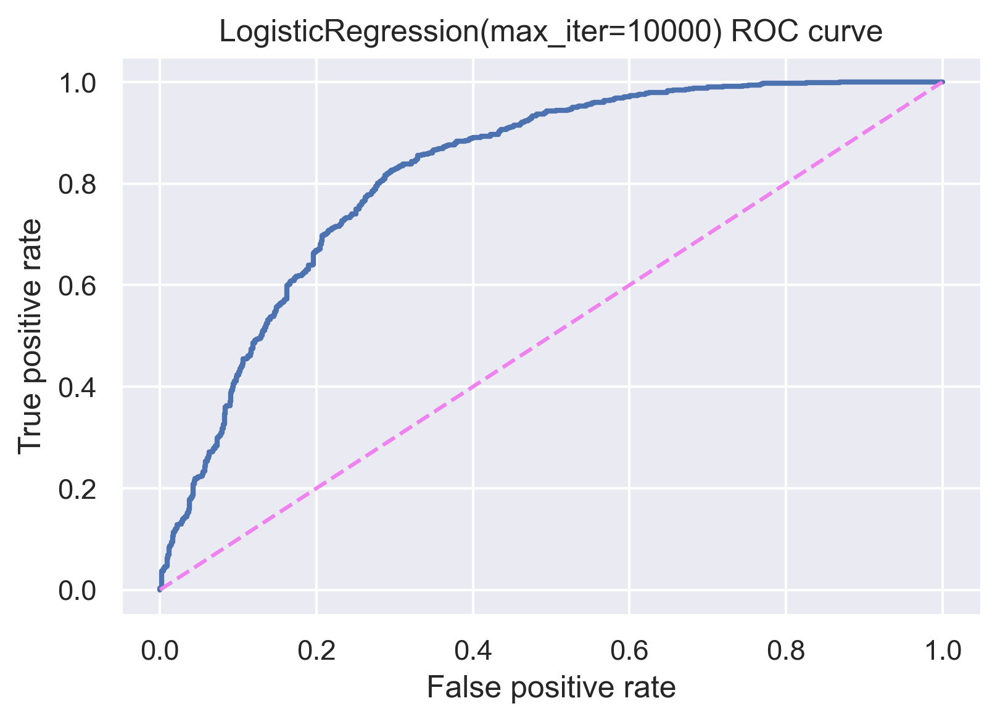

In [48]:
val_roc_curve(lr)

                 precision    recall  f1-score   support

Not a Candidate       0.81      0.70      0.75       873
      Candidate       0.73      0.83      0.78       852

       accuracy                           0.77      1725
      macro avg       0.77      0.77      0.77      1725
   weighted avg       0.77      0.77      0.77      1725



<Figure size 900x600 with 0 Axes>

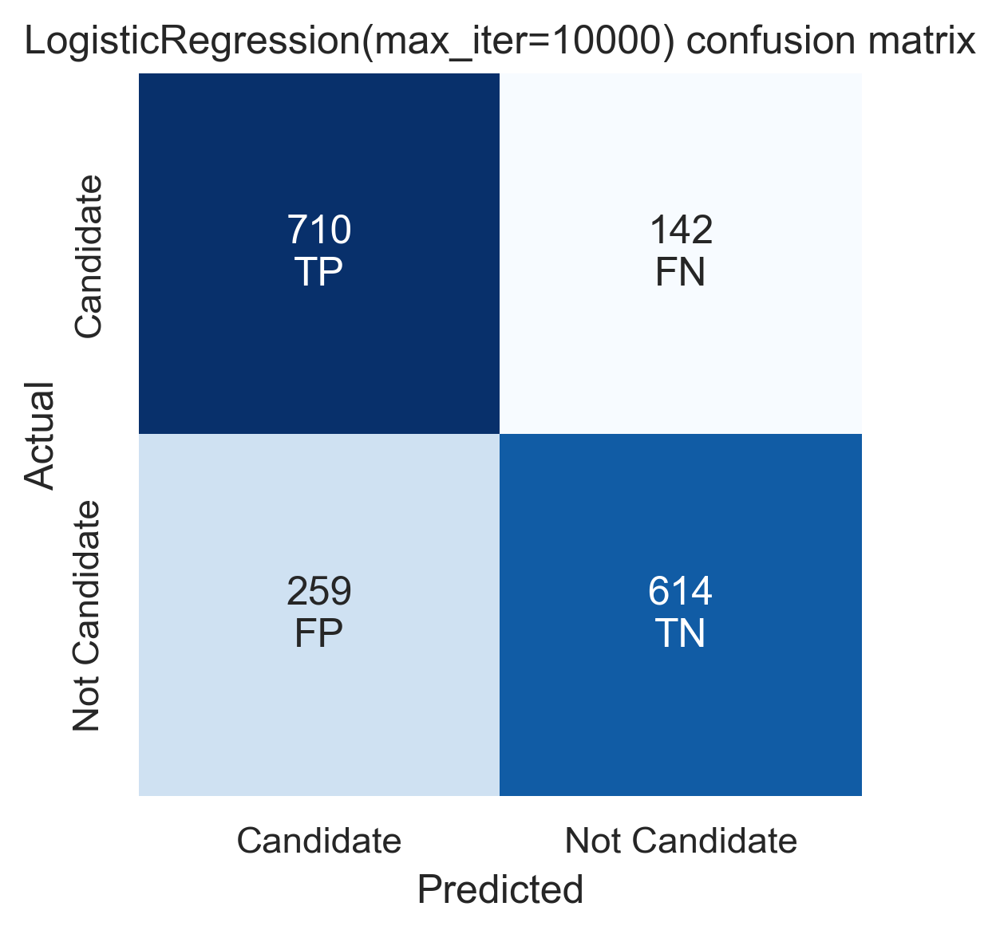

In [67]:
val_confusion_matrix(lr);

In [134]:
dt = DecisionTreeClassifier(max_depth = 5)
test_model(dt)

Model: DecisionTreeClassifier(max_depth=5) 

accuracy:
Train score: 0.822
Test  score: 0.802
**************************************************
precision:
Train score: 0.801
Test  score: 0.781
**************************************************
recall:
Train score: 0.858
Test  score: 0.841
**************************************************
f1:
Train score: 0.829
Test  score: 0.809
**************************************************
roc_auc:
Train score: 0.882
Test  score: 0.856
**************************************************


<Figure size 900x600 with 0 Axes>

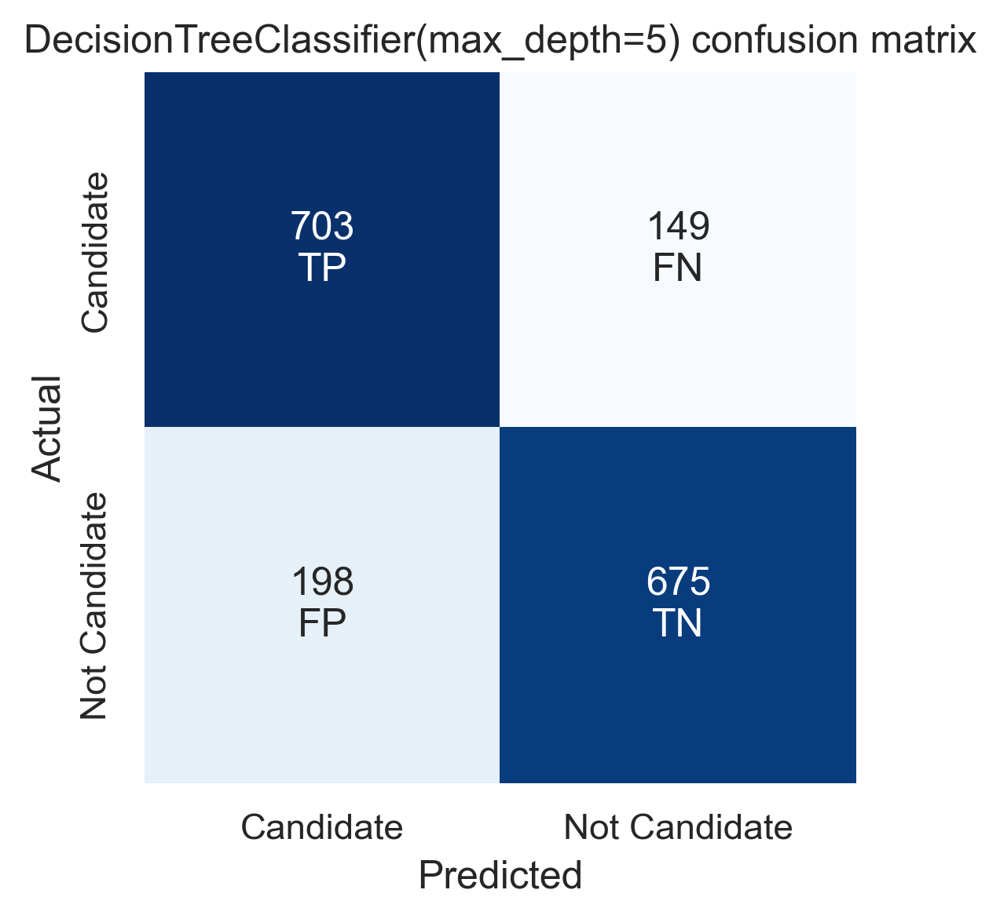

In [135]:
val_confusion_matrix(dt)

In [53]:
rf = RandomForestClassifier(n_estimators=300,max_depth=10)
test_model(rf)

Model: RandomForestClassifier(max_depth=10, n_estimators=300) 

accuracy:
Train score: 0.927
Test  score: 0.832
**************************************************
precision:
Train score: 0.890
Test  score: 0.812
**************************************************
recall:
Train score: 0.976
Test  score: 0.866
**************************************************
f1:
Train score: 0.931
Test  score: 0.838
**************************************************
roc_auc:
Train score: 0.974
Test  score: 0.917
**************************************************


<Figure size 900x600 with 0 Axes>

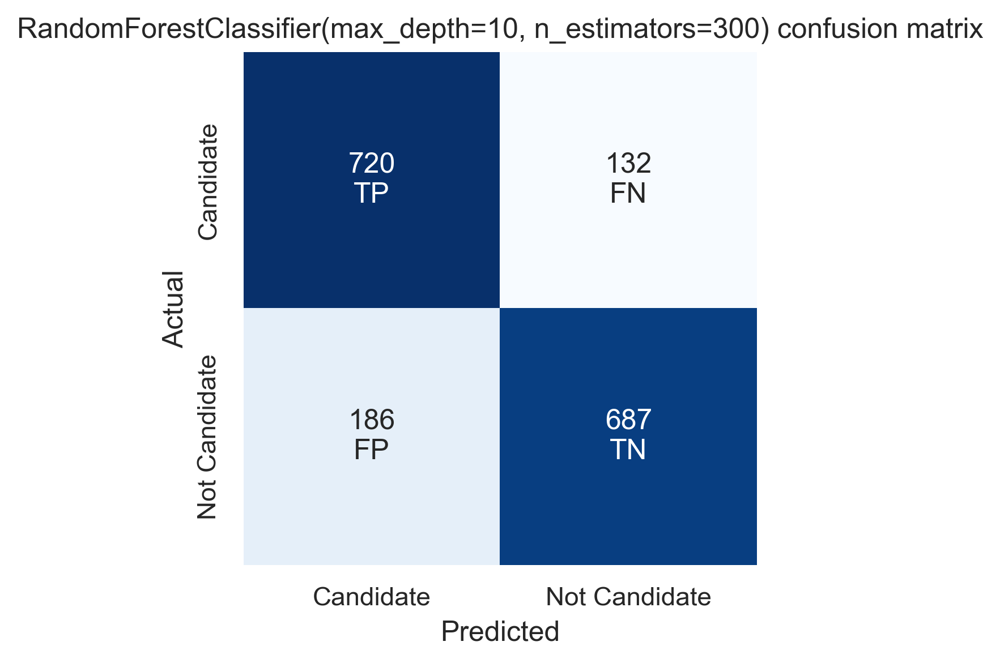

In [54]:
val_confusion_matrix(rf)

In [27]:
gb = GradientBoostingClassifier()
test_model(gb)

Model: GradientBoostingClassifier() 

accuracy:
Train score: 0.873
Test  score: 0.838
**************************************************
precision:
Train score: 0.853
Test  score: 0.818
**************************************************
recall:
Train score: 0.901
Test  score: 0.870
**************************************************
f1:
Train score: 0.876
Test  score: 0.843
**************************************************
roc_auc:
Train score: 0.949
Test  score: 0.919
**************************************************


ROC AUC score =  0.9196142905538021


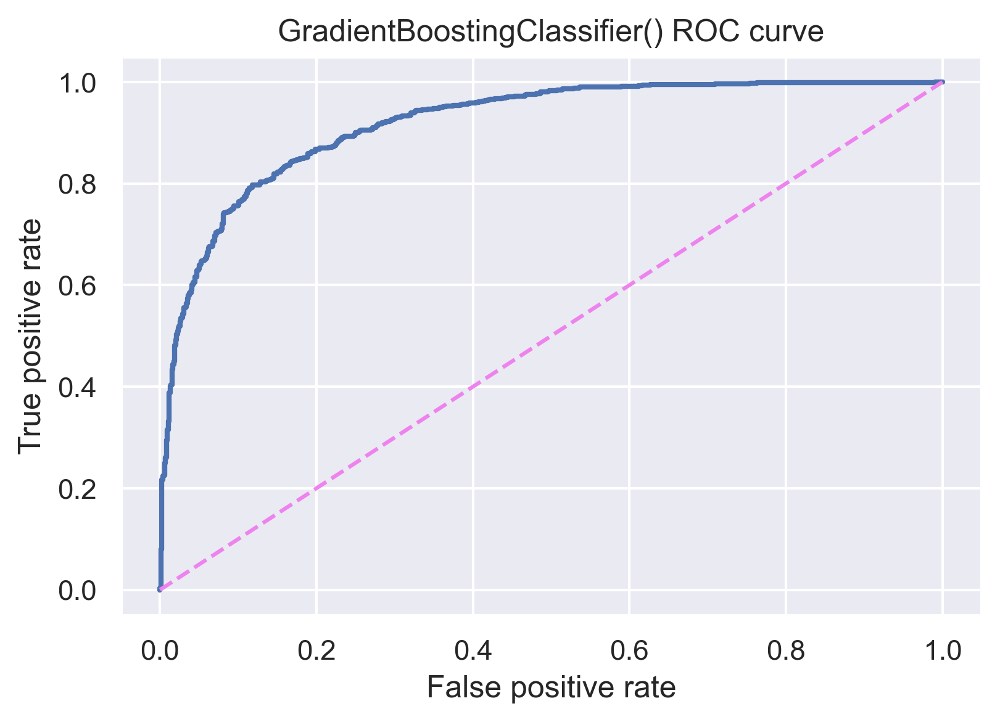

In [28]:
val_roc_curve(gb)

In [140]:
ab = AdaBoostClassifier()
test_model(ab)

Model: AdaBoostClassifier() 

accuracy:
Train score: 0.828
Test  score: 0.810
**************************************************
precision:
Train score: 0.807
Test  score: 0.790
**************************************************
recall:
Train score: 0.863
Test  score: 0.844
**************************************************
f1:
Train score: 0.834
Test  score: 0.816
**************************************************
roc_auc:
Train score: 0.914
Test  score: 0.895
**************************************************


In [14]:
nb = GaussianNB()
test_model(nb)

Model: GaussianNB() 

accuracy:
Train score: 0.649
Test  score: 0.650
**************************************************
precision:
Train score: 0.590
Test  score: 0.591
**************************************************
recall:
Train score: 0.979
Test  score: 0.978
**************************************************
f1:
Train score: 0.736
Test  score: 0.737
**************************************************
roc_auc:
Train score: 0.840
Test  score: 0.839
**************************************************


<Figure size 900x600 with 0 Axes>

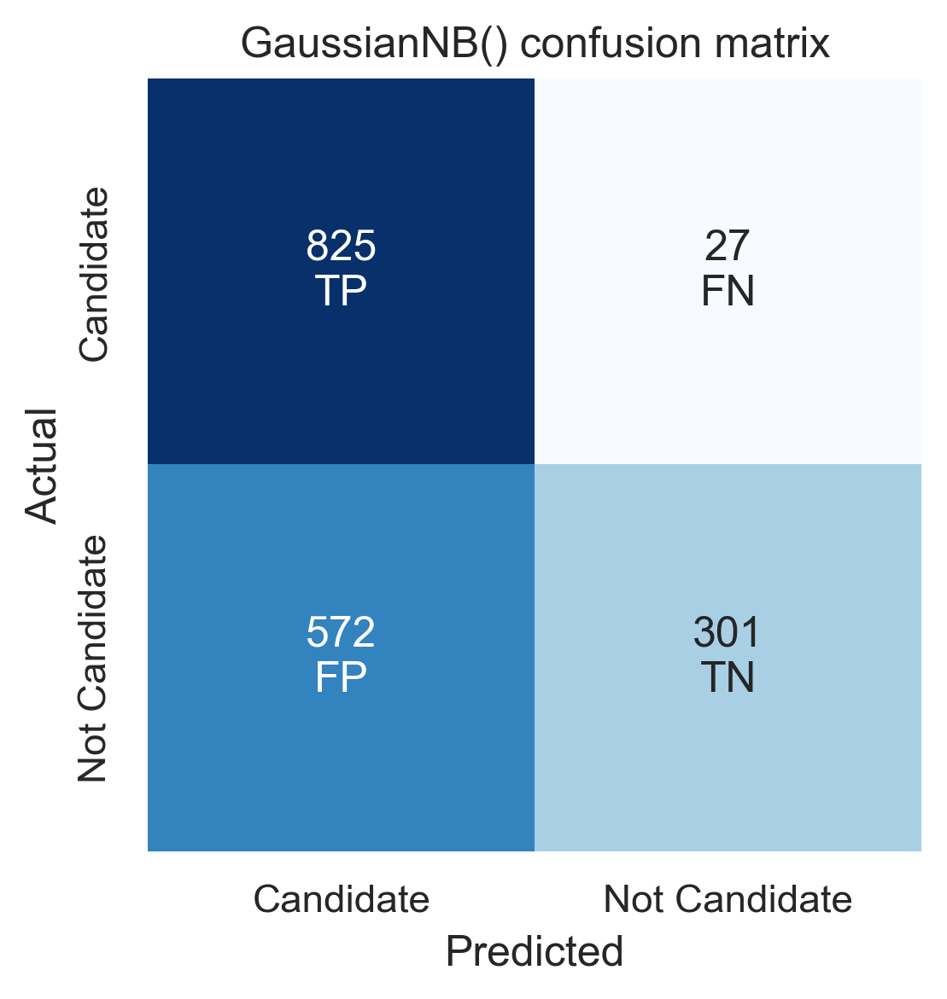

In [15]:
val_confusion_matrix(nb)

NB has the highest recall, but unaccetably low precision/accuracy/f1. It would waste too much time

In [127]:
knn = make_pipeline(StandardScaler(), KNeighborsClassifier(n_neighbors=5))
test_model(knn)

Model: Pipeline(steps=[('standardscaler', StandardScaler()),
                ('kneighborsclassifier', KNeighborsClassifier())]) 

accuracy:
Train score: 0.837
Test  score: 0.771
**************************************************
precision:
Train score: 0.807
Test  score: 0.744
**************************************************
recall:
Train score: 0.887
Test  score: 0.827
**************************************************
f1:
Train score: 0.845
Test  score: 0.783
**************************************************
roc_auc:
Train score: 0.925
Test  score: 0.837
**************************************************


Gradient boosting and RF seem to perform the best overall, so I want to try XGBoost.

## Trying different feature sets with original data

### Reduced set of all_featuers

In [33]:
#Throw out some features: tranit_epoch is just date, insol_flux is related to temperature, ra, dec, and kepler_band
#are not parameters of the observed planet/star
reduced_features = ['period', 'impact_parameter', 'transit_duration', 'transit_depth',
                  'radius', 'eq_temp', 'signal_to_noise', 'stellar_eff_temp', 'stellar_surf_grav', 'stellar_radius']

#Properties of just the planet/transit observation, not the star
planet_features = ['period', 'impact_parameter', 'transit_duration', 'transit_depth',
                  'radius', 'eq_temp', 'signal_to_noise']



In [55]:
rf = RandomForestClassifier(n_estimators=200, max_depth=10)

In [72]:
test_model(rf, features=all_features,)

Model: RandomForestClassifier(max_depth=10, n_estimators=200) 

accuracy:
Train score: 0.926
Test  score: 0.833
**************************************************
precision:
Train score: 0.888
Test  score: 0.811
**************************************************
recall:
Train score: 0.975
Test  score: 0.867
**************************************************
f1:
Train score: 0.929
Test  score: 0.838
**************************************************
roc_auc:
Train score: 0.974
Test  score: 0.917
**************************************************


In [59]:
test_model(rf, features=reduced_features)

Model: RandomForestClassifier(max_depth=10, n_estimators=200) 

accuracy:
Train score: 0.927
Test  score: 0.838
**************************************************
precision:
Train score: 0.891
Test  score: 0.816
**************************************************
recall:
Train score: 0.973
Test  score: 0.871
**************************************************
f1:
Train score: 0.930
Test  score: 0.843
**************************************************
roc_auc:
Train score: 0.972
Test  score: 0.918
**************************************************


In [60]:
test_model(rf, features=planet_features)

Model: RandomForestClassifier(max_depth=10, n_estimators=200) 

accuracy:
Train score: 0.922
Test  score: 0.827
**************************************************
precision:
Train score: 0.889
Test  score: 0.807
**************************************************
recall:
Train score: 0.965
Test  score: 0.859
**************************************************
f1:
Train score: 0.925
Test  score: 0.833
**************************************************
roc_auc:
Train score: 0.968
Test  score: 0.913
**************************************************


In [61]:
test_model(rf, features=reduced_features+['ra','dec'])

Model: RandomForestClassifier(max_depth=10, n_estimators=200) 

accuracy:
Train score: 0.928
Test  score: 0.834
**************************************************
precision:
Train score: 0.891
Test  score: 0.813
**************************************************
recall:
Train score: 0.974
Test  score: 0.867
**************************************************
f1:
Train score: 0.931
Test  score: 0.839
**************************************************
roc_auc:
Train score: 0.975
Test  score: 0.919
**************************************************


Looks like reduced_features (i.e. just the fit parameters and info on the star) perform the best by a small margin

### Using extra fit/planet/stellar features

In [47]:
rf = RandomForestClassifier(n_estimators=200, max_depth=5)
test_model(rf, df=train_df2, features=all_features2)

Model: RandomForestClassifier(max_depth=5, n_estimators=200) 

accuracy:
Train score: 0.868
Test  score: 0.854
**************************************************
precision:
Train score: 0.843
Test  score: 0.830
**************************************************
recall:
Train score: 0.915
Test  score: 0.901
**************************************************
f1:
Train score: 0.878
Test  score: 0.864
**************************************************
roc_auc:
Train score: 0.944
Test  score: 0.931
**************************************************


In [48]:
rf = RandomForestClassifier(n_estimators=200, max_depth=5)
test_model(rf, df=train_df2, features=reduced_features)

Model: RandomForestClassifier(max_depth=5, n_estimators=200) 

accuracy:
Train score: 0.855
Test  score: 0.842
**************************************************
precision:
Train score: 0.824
Test  score: 0.813
**************************************************
recall:
Train score: 0.915
Test  score: 0.901
**************************************************
f1:
Train score: 0.867
Test  score: 0.855
**************************************************
roc_auc:
Train score: 0.935
Test  score: 0.922
**************************************************


Using the dataset with extra features helps a little, going to use that in the final modeling nb

## XGBoost

In [207]:
def xgb_test_model(df = train_df, features=all_features, target=disposition, score_list=score_list):
    X = df[features]
    y = df[target]
    X_train, X_val, y_train, y_val = train_test_split(X,y, test_size = .25)
    
    
    gbm = xgb.XGBClassifier( 
                            n_estimators=50000,
                            max_depth=7,
                            objective='binary:logistic', 
                            learning_rate=.05, 
                            subsample=1,
                            min_child_weight=3,
                            colsample_bytree=.8,
                            use_label_encoder=False
                           )

    eval_set=[(X_train,y_train),(X_val,y_val)]
    fit_model = gbm.fit( 
                        X_train, y_train, 
                        #eval_set=eval_set,
                        #eval_metric='error', 
                        #early_stopping_rounds=50,
                        verbose=False
                        )
    y_pred = gbm.predict(X_val, ntree_limit=gbm.best_ntree_limit)
    
    print('Accuracy: {:.3f}'.format(accuracy_score(y_val,y_pred)))
    print('Recall: {:.3f}'.format(recall_score(y_val,y_pred)))
    return gbm
def xgb_test_model_CV(df = train_df, features=all_features, target=disposition, preprocessor = None):
    X = np.array(df[features])
    y = np.array(df[target])
    if preprocessor:
        X = preprocessor.fit_transform(X)
    gbm = xgb.XGBClassifier( 
                            n_estimators=50000,
                            max_depth=6,
                            objective='binary:logistic', 
                            learning_rate=.025, 
                            subsample=1,
                            min_child_weight=1,
                            colsample_bytree=.8,
                            use_label_encoder=False,
                           )
    accuracies = []
    recalls = []
    precisions = []
    f1s =[]
    roc_aucs= []
    
    kf = KFold()
    for train_index, val_index in kf.split(X):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y[train_index], y[val_index]
        
        eval_set=[(X_train,y_train),(X_val,y_val)]
        fit_model = gbm.fit( 
                        X_train, y_train, 
                        eval_set=eval_set,
                        eval_metric='error', 
                        early_stopping_rounds=50,
                        verbose=False
                        )
        y_pred = gbm.predict(X_val)
        #y_pred = gbm.predict(X_val, ntree_limit=gbm.best_ntree_limit)
        accuracies.append(accuracy_score(y_val, y_pred))
        recalls.append(recall_score(y_val, y_pred))
        precisions.append(precision_score(y_val, y_pred))
        f1s.append(f1_score(y_val, y_pred))
        roc_aucs.append(roc_auc_score(y_val, y_pred))
    print('Mean validation accuracy: {:.3f}'.format(np.mean(accuracies)))
    print('Mean validation recall  : {:.3f}'.format(np.mean(recalls)))
    print('Mean validation precision: {:.3f}'.format(np.mean(precisions)))
    print('Mean validation f1  : {:.3f}'.format(np.mean(f1s)))
    print('Mean validation roc_auc: {:.3f}'.format(np.mean(roc_aucs)))


In [165]:
print('Data 2, all features')
xgb_test_model_CV(df=train_df2, features=all_features2);
print('Data 2, reduced features')
xgb_test_model_CV(df=train_df2, features=reduced_features);

Data 2, all features
Mean validation accuracy: 0.883
Mean validation recall  : 0.918
Mean validation precision: 0.864
Mean validation f1  : 0.890
Mean validation roc_auc: 0.882
Data 2, reduced features
Mean validation accuracy: 0.874
Mean validation recall  : 0.915
Mean validation precision: 0.850
Mean validation f1  : 0.881
Mean validation roc_auc: 0.873


In [81]:
xgb_test_model_CV(df=train_df2, features=reduced_features);

Mean validation accuracy: 0.882
Mean validation recall  : 0.911


## XGBoost grid search

In [201]:
X, y = train_df2[all_features2], train_df2[disposition]
X_train, X_val, y_train, y_val = train_test_split(X,y, test_size = .2)

In [147]:
eval_set = [X_val, y_val]

fit_params = {'eval_metric': 'error', 'eval_set': [eval_set], 'early_stopping_rounds':50, 'verbose':False}

gbm = xgb.XGBClassifier( 
                        n_estimators=50000,
                        objective='binary:logistic', 
                        min_child_weight=1,
                        subsample = 1,
                        colsample_bytree=.8,
                        use_label_encoder=False
                       )
paramGrid = {'max_depth': [2,4,6,8,10], 'learning_rate': [.025, .05, .1], 'gamma': [0,1,5]}

clf = GridSearchCV(gbm, paramGrid, scoring = 'recall', n_jobs=4)

In [148]:
clf.fit(X_train, y_train, **fit_params);

In [149]:
print(clf.best_params_)
print(clf.best_score_)

{'gamma': 1, 'learning_rate': 0.025, 'max_depth': 6}
0.9102179691653376


Ran this multiple times, for final model parameters see the final modeling nb

## Ensemble classifier

In [143]:
clf1 = ('LR',LogisticRegression(max_iter =10000 ))
clf2 = ('KNN',make_pipeline(StandardScaler(), KNeighborsClassifier()))
clf3 = ('RF',RandomForestClassifier(max_depth = 5))
gbm = xgb.XGBClassifier( 
                        learning_rate= 0.025,
                        max_depth = 6,
                        n_estimators=50000,
                        objective='binary:logistic', 
                        min_child_weight=1,
                        subsample = 1,
                        colsample_bytree=.8,
                        use_label_encoder=False
                       )
sc = StackingClassifier(estimators = [clf1,clf2,clf3], final_estimator = GradientBoostingClassifier())
sc.fit(X_train, y_train);

In [144]:
test_model(sc, df = train_df2, features=all_features2)

Model: StackingClassifier(estimators=[('LR', LogisticRegression(max_iter=10000)),
                               ('KNN',
                                Pipeline(steps=[('standardscaler',
                                                 StandardScaler()),
                                                ('kneighborsclassifier',
                                                 KNeighborsClassifier())])),
                               ('RF', RandomForestClassifier(max_depth=5))],
                   final_estimator=GradientBoostingClassifier()) 

accuracy:
Train score: 0.880
Test  score: 0.860
**************************************************
precision:
Train score: 0.873
Test  score: 0.855
**************************************************
recall:
Train score: 0.897
Test  score: 0.877
**************************************************
f1:
Train score: 0.885
Test  score: 0.866
**************************************************
roc_auc:
Train score: 0.954
Test  score: 0.933
**************

Not as good as XGBoost, takes a lot longer, and less interpretable, just going to go forward with XGBoost

## Testing different feature sets with XGBoost and new data

In [163]:
transit_features = ['transit_duration', 'transit_depth', 'mme_stat', 'signal_to_noise', 'num_transits', 'oedc_stat']

system_features = ['period', 'impact_parameter', 'radius', 'sma', 'inclination', 'eq_temp', 'stellar_eff_temp',
                  'stellar_surf_grav', 'stellar_metal', 'stellar_radius', 'stellar_mass']
no_star_features = list(all_features2[:-5])

no_planet_features = ['transit_duration', 'transit_depth', 'mme_stat', 'signal_to_noise', 'num_transits',
                      'oedc_stat', 'stellar_eff_temp','stellar_surf_grav', 'stellar_metal', 'stellar_radius', 'stellar_mass']

In [198]:
print('Data 2, all features')
xgb_test_model_CV(df=train_df2, features=all_features2);

print('Data 2, transit features')
xgb_test_model_CV(df=train_df2, features=transit_features);

print('Data 2, system features')
xgb_test_model_CV(df=train_df2, features=system_features);

print('Data 2, no star features')
xgb_test_model_CV(df=train_df2, features=no_star_features);

print('Data 2, no planet features')
xgb_test_model_CV(df=train_df2, features=no_planet_features);

Data 2, all features
Mean validation accuracy: 0.883
Mean validation recall  : 0.918
Mean validation precision: 0.864
Mean validation f1  : 0.890
Mean validation roc_auc: 0.882
Data 2, transit features
Mean validation accuracy: 0.828
Mean validation recall  : 0.886
Mean validation precision: 0.800
Mean validation f1  : 0.841
Mean validation roc_auc: 0.827
Data 2, system features
Mean validation accuracy: 0.865
Mean validation recall  : 0.900
Mean validation precision: 0.848
Mean validation f1  : 0.873
Mean validation roc_auc: 0.865
Data 2, no star features
Mean validation accuracy: 0.871
Mean validation recall  : 0.909
Mean validation precision: 0.850
Mean validation f1  : 0.878
Mean validation roc_auc: 0.870
Data 2, no planet features
Mean validation accuracy: 0.853
Mean validation recall  : 0.905
Mean validation precision: 0.827
Mean validation f1  : 0.864
Mean validation roc_auc: 0.852


Seems like across all metrics its best to keep all features in. Unlike with the first dataset, all_features2 doesnt have repeats/superfluous features

In [203]:
pf_gb = make_pipeline(PolynomialFeatures(), GradientBoostingClassifier())
test_model(pf_rf, df = train_df2, features = all_features2)

Model: Pipeline(steps=[('polynomialfeatures', PolynomialFeatures()),
                ('gradientboostingclassifier', GradientBoostingClassifier())]) 

accuracy:
Train score: 0.918
Test  score: 0.876
**************************************************
precision:
Train score: 0.900
Test  score: 0.861
**************************************************
recall:
Train score: 0.946
Test  score: 0.904
**************************************************
f1:
Train score: 0.923
Test  score: 0.882
**************************************************
roc_auc:
Train score: 0.978
Test  score: 0.950
**************************************************


In [204]:
print('Data 2, all features')
xgb_test_model_CV(df=train_df2, features=all_features2, preprocessor=PolynomialFeatures());

Data 2, all features
Mean validation accuracy: 0.883
Mean validation recall  : 0.913
Mean validation precision: 0.866
Mean validation f1  : 0.889
Mean validation roc_auc: 0.882


Polynomial features doesnt really help the performance of XGBoost, but it does with GradientBoostingClassifier. The boost to recall doesn't catch it up to XGBoost performance, but it's roc_auc exceeds that of XGBoost, which is interesting

## Looking at misclassifications

In [205]:
X, y = train_df2[all_features2], train_df2[disposition]
X_train, X_val, y_train, y_val = train_test_split(X,y, test_size = .3)

In [206]:
xgb_model = xgb.XGBClassifier( 
                        n_estimators=50000,
                        max_depth = 6,
                        eta = 0.025,
                        objective='binary:logistic', 
                        min_child_weight=1,
                        subsample = 1,
                        colsample_bytree=.8,
                        use_label_encoder=False
                       )
eval_set = [(X_val, y_val)]

xgb_model.fit( X_train, y_train, eval_set=eval_set,eval_metric='error', early_stopping_rounds=50,verbose=False)

XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
              colsample_bynode=1, colsample_bytree=0.8, eta=0.025, gamma=0,
              gpu_id=-1, importance_type='gain', interaction_constraints='',
              learning_rate=0.0250000004, max_delta_step=0, max_depth=6,
              min_child_weight=1, missing=nan, monotone_constraints='()',
              n_estimators=50000, n_jobs=8, num_parallel_tree=1, random_state=0,
              reg_alpha=0, reg_lambda=1, scale_pos_weight=1, subsample=1,
              tree_method='exact', use_label_encoder=False,
              validate_parameters=1, verbosity=None)

In [210]:
y_val_preds =  xgb_model.predict(X_val)
print(recall_score(y_val, y_val_preds))

0.9079956188389924


In [214]:
mistakes_df = X_val.copy()
mistakes_df['real'] = y_val
mistakes_df['predicted'] = y_val_preds
mistakes_df['correct'] = mistakes_df['real'] == mistakes_df['predicted']
mistakes_df.head(30)

,period,impact_parameter,transit_duration,transit_depth,radius,sma,inclination,eq_temp,mse_stat,mme_stat,signal_to_noise,num_transits,oedc_stat,stellar_eff_temp,stellar_surf_grav,stellar_metal,stellar_radius,stellar_mass,real,predicted,correct
rowid,,,,,,,,,,,,,,,,,,,,,
8944,8.049635,0.671,6.00488,280000.0,95.98,0.0834,87.41,1247.0,2554.158200,12314.379000,5246.5,0.0,-1.0000,6698.0,4.171,-0.38,1.485,1.197,0,0,True
498,48.647854,0.988,5.46400,642.0,4.14,0.2642,87.42,489.0,4.091152,10.062120,12.2,20.0,0.0722,5779.0,4.477,0.14,0.974,1.037,1,1,True
4571,31.778756,0.290,8.09300,262.0,1.50,0.1803,89.43,564.0,5.416473,18.454851,25.9,42.0,0.3361,5638.0,4.391,-0.42,0.928,0.773,1,1,True
9190,183.836254,0.956,13.08800,1050.0,51.64,0.7889,88.75,852.0,6.821138,7.580869,15.7,4.0,0.7698,4959.0,2.569,-0.44,11.963,1.934,0,0,True
3163,289.864067,0.856,7.56500,529.0,2.34,0.7961,89.70,257.0,22.129465,35.636192,57.4,4.0,0.3901,5516.0,4.446,-0.26,0.886,0.799,1,1,True
7955,5.776764,0.880,6.99715,154000.0,117.51,0.0665,83.60,1542.0,1590.791600,12056.819000,3033.4,235.0,0.0000,6263.0,3.875,-0.34,2.072,1.173,0,0,True
6543,83.499618,0.341,16.03000,501.0,1.72,0.3371,89.49,343.0,5.220567,11.883194,16.1,13.0,0.5037,5141.0,4.526,-0.24,0.773,0.731,1,1,True
176,20.026141,0.957,1.61100,421.0,2.28,0.1409,88.43,559.0,3.572960,9.322174,10.7,54.0,0.5513,5237.0,4.572,0.24,0.826,0.927,1,1,True
8870,208.543350,0.001,9.85100,615.0,2.84,0.6732,90.00,321.0,4.466479,8.227344,10.4,4.0,0.2262,5533.0,4.275,0.16,1.166,0.934,1,1,True


In [238]:
plt.figure(figsize=(20,20))
sns.pairplot(data = mistakes_df, hue = 'correct')

<Figure size 1440x1440 with 0 Axes>

In [217]:
@interact_manual
def plot_features(x=mistakes_df.columns, y=mistakes_df.columns,):
    if x!=y:
        sns.scatterplot(data=mistakes_df, x=x, y=y, hue='correct')
    if x==y:
        sns.kdeplot(data=mistakes_df, x=x, hue='correct')

interactive(children=(Dropdown(description='x', options=('period', 'impact_parameter', 'transit_duration', 'tr…

In [249]:
@interact_manual
def plot_dists(x=mistakes_df.columns):
    sns.kdeplot(data=mistakes_df, x=x, hue='correct')

interactive(children=(Dropdown(description='x', options=('period', 'impact_parameter', 'transit_duration', 'tr…

Not a ton of immediately obvious information, but it does seem like sma and oedc might be good columns to get rid of. Really should already have gotten rid of sma because of how its related to period via Keplers laws.

In [243]:
no_sma = list(all_features2[:5]) + list(all_features2[6:])
no_oedc = list(all_features2[:12]) + list(all_features2[13:]) 

In [218]:
xgb_test_model_CV(df = test_df2, features = all_features2)

Mean validation accuracy: 0.872
Mean validation recall  : 0.907
Mean validation precision: 0.850
Mean validation f1  : 0.878
Mean validation roc_auc: 0.871


In [237]:
xgb_test_model_CV(df = test_df2, features = no_sma)

Mean validation accuracy: 0.872
Mean validation recall  : 0.909
Mean validation precision: 0.850
Mean validation f1  : 0.878
Mean validation roc_auc: 0.871


In [245]:
xgb_test_model_CV(df = test_df2, features = no_oedc)

Mean validation accuracy: 0.870
Mean validation recall  : 0.902
Mean validation precision: 0.852
Mean validation f1  : 0.876
Mean validation roc_auc: 0.870


### Leaving out each feature

In [254]:
for i in range(len(all_features2)):
    features = list(all_features2[:i]) + list(all_features2[i+1:])
    print(all_features2[i])
    xgb_test_model_CV(df=test_df2, features = features)

period
Mean validation accuracy: 0.868
Mean validation recall  : 0.898
Mean validation precision: 0.851
Mean validation f1  : 0.874
Mean validation roc_auc: 0.868
impact_parameter
Mean validation accuracy: 0.873
Mean validation recall  : 0.904
Mean validation precision: 0.855
Mean validation f1  : 0.879
Mean validation roc_auc: 0.873
transit_duration
Mean validation accuracy: 0.874
Mean validation recall  : 0.904
Mean validation precision: 0.856
Mean validation f1  : 0.879
Mean validation roc_auc: 0.873
transit_depth
Mean validation accuracy: 0.874
Mean validation recall  : 0.903
Mean validation precision: 0.857
Mean validation f1  : 0.879
Mean validation roc_auc: 0.874
radius
Mean validation accuracy: 0.872
Mean validation recall  : 0.907
Mean validation precision: 0.852
Mean validation f1  : 0.878
Mean validation roc_auc: 0.872
sma
Mean validation accuracy: 0.872
Mean validation recall  : 0.909
Mean validation precision: 0.850
Mean validation f1  : 0.878
Mean validation roc_auc: 0.87

Seems like getting rid of sma and eq_temp will help

In [260]:
best_feats =['period',
 'impact_parameter',
 'transit_duration',
 'transit_depth',
 'radius',
 'inclination',
 'mse_stat',
 'mme_stat',
 'signal_to_noise',
 'num_transits',
 'oedc_stat',
 'stellar_eff_temp',
 'stellar_surf_grav',
 'stellar_metal',
 'stellar_radius',
 'stellar_mass']

In [263]:
xgb_test_model_CV(df = test_df2, features = all_features2)
print('New set')
xgb_test_model_CV(df = test_df2, features = best_feats)

Mean validation accuracy: 0.872
Mean validation recall  : 0.907
Mean validation precision: 0.850
Mean validation f1  : 0.878
Mean validation roc_auc: 0.871
New set
Mean validation accuracy: 0.870
Mean validation recall  : 0.910
Mean validation precision: 0.847
Mean validation f1  : 0.877
Mean validation roc_auc: 0.870


Looks like tossing semi-major axis and equilibrium temp marginally increased recall performance, while hurting other metrics.